# Image Segmentation with U-Nets
*Note*: This tutorial is modified from the [pix2pix tutorial](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb) by the TensorFlow authors.

In this exercise, we will be leveraging U-Nets to automate image segmentation. We will provide real images as input data, and output the segmented image. The topics we will cover are:

- Loading Data
- Exploratory Data Analysis 
- Data Preprocessing and Augmentation
- Creating a `tf.data.Dataset`
- Creating a sophisticated neural network using convolutional layers
- Training on a GPU
- Keras callbacks
- TensorBoard
- Advanced Keras

In [ ]:
# Necessary Imports
import numpy as np

import tensorflow as tf
import tensorflow.keras as tfk 
import tensorflow.keras.layers as tfkl

from sklearn import cluster

import pathlib

from matplotlib import pyplot as plt
import seaborn as sns

%matplotlib inline
# We'd like to monitor training in TensorBoard
%load_ext tensorboard

It's often helpful to mount our Google Drive to Colab so we can read/write data quickly.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Let's take a look a the GPU we've been assigned.

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
else:
    print(gpu_info)

Tue Apr 26 03:11:45 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    31W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## The Data
We are going to be building our training and test datasets in this section.
### Loading the Data
Colab has a neat trick where you can specify parameters to choose the value of a variable. Let's select a dataset.

In [ ]:
dataset_name = "cityscapes" #@param ["cityscapes", "edges2handbags", "edges2shoes", "facades", "maps", "night2day"]

We are going to download the compressed dataset from the web and extract it using `tf.keras.utils`. The `pathlib` module gives us a convenient way to handle these paths. In general, directly downloading our dataset is useful when we don't want to spend the time to extract the data locally and upload it ourselves. 

In [ ]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tfk.utils.get_file(
    fname=f'{dataset_name}.tar.gz',
    origin=_URL,
    extract=True)

path_to_zip = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

103456768/103441232 [==============================] - 78s 1us/step


The `tf.io` submodule has useful methods to load/process data.

In [ ]:
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


We can see that each image consists of our input and target labels concatenated side by side, so we'll need to split these images in half.

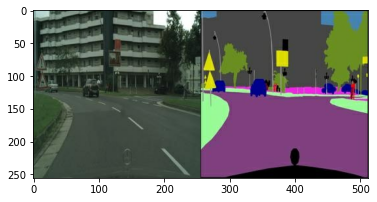

In [ ]:
plt.figure()
plt.imshow(sample_image)
plt.show()

In [ ]:
def load(image_file):
    # TODO: Decode image as uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # TODO: Split image in half
    w = tf.shape(image)[1] // 2
    input_image = image[:, :w, :]
    real_image = image[:, w:, :]

    # TODO: Cast both images to float32 tensors
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

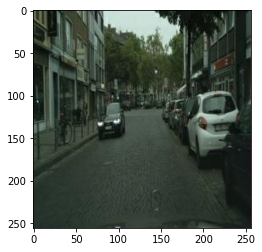

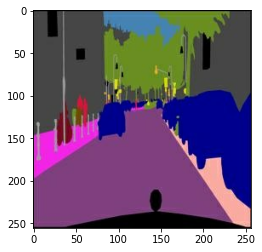

In [ ]:
inp, re = load(str(PATH / 'train/100.jpg'))
# Normalizing between [0, 1] to display images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)
plt.show()

### Exploratory Data Analysis
It's a good idea to analyze our dataset to get an idea of what our model will be seeing. We will use the above image as a toy example. 

In [ ]:
OUTPUT_CHANNELS = inp.shape[-1]

In [ ]:
# Tensor of shape (256 * 256, 3)
pixel_matrix = tf.reshape(inp, (-1, OUTPUT_CHANNELS))

Let's plot the distribution of pixel intensities for each channel.

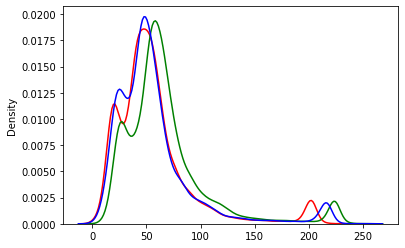

In [ ]:
sns.kdeplot(pixel_matrix[:, 0], color='red')
sns.kdeplot(pixel_matrix[:, 1], color='green')
sns.kdeplot(pixel_matrix[:, 2], color='blue')
plt.show()

Let's use a 2D histogram, which groups (x, y) pairs into bins. The intensity shows the number of counts of that (x, y) pair. In our case, our (x, y) pairs will be the intensities of our color channels.

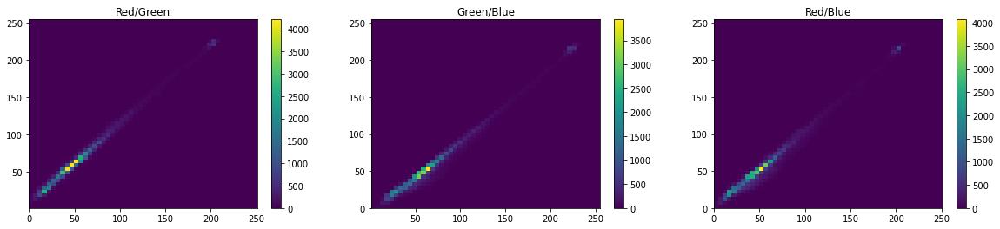

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(20, 4))
axs = axs.ravel()
axs[0].set_title('Red/Green')
h1 = axs[0].hist2d(pixel_matrix[:, 0], pixel_matrix[:, 1], bins=(50, 50))
fig.colorbar(h1[3], ax=axs[0])
axs[1].set_title('Green/Blue')
h2 = axs[1].hist2d(pixel_matrix[:, 1], pixel_matrix[:, 2], bins=(50, 50))
fig.colorbar(h2[3], ax=axs[1])
axs[2].set_title('Red/Blue')
h3 = axs[2].hist2d(pixel_matrix[:, 0], pixel_matrix[:, 2], bins=(50, 50))
fig.colorbar(h3[3], ax=axs[2])
plt.show()

Finally, let's use k-means clustering to see what an unsupervised algorithm would segment this image as. As we can see, it doesn't resemble our target image very much.

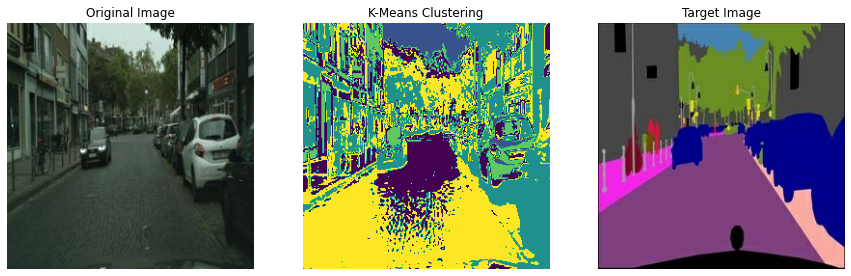

In [ ]:
kmeans = cluster.KMeans(5)
clustered = kmeans.fit_predict(pixel_matrix)

dims = np.shape(inp)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Original Image')
plt.axis('off')
plt.imshow(inp / 255.0)
plt.subplot(132)
plt.title('K-Means Clustering')
plt.axis('off')
plt.imshow(clustered_img)
plt.subplot(133)
plt.title('Target Image')
plt.axis('off')
plt.imshow(re / 255.0)
plt.show()

### Data Augmentation
We will perform random jittering on our images in an attempt to get our model to learn a more robust distribution of the data.

In [ ]:
# Length of cityscapes dataset
BUFFER_SIZE = 2975
BATCH_SIZE = 8
IMG_WIDTH = 256
IMG_HEIGHT = 256

We use nearest-neighbors to resize our image.

In [ ]:
def resize(input_image, real_image, height, width):
    # TODO: Resize images
    input_image = tf.image.resize(input_image, [height, width],
                                  method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                                 method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

We randomly crop an image down to a 256x256 image.

In [ ]:
def random_crop(input_image, real_image):
    # TODO: Stack images
    stacked_image = tf.stack([input_image, real_image], axis=0)

    # TODO: Randomly crop images
    cropped_image = tf.image.random_crop(stacked_image, 
                                         size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

Empirically, it's better to normalize between [-1, 1] rather than [0, 1] for training.

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    # TODO: Normalize images
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

The steps of random jittering are:
- Resize image to 286x286.
- Randomly crop image back to 256x256.
- Flip the image left-right with a 50% probability.

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
    # TODO: Resize to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # TODO: Random crop to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    # TODO: Random mirroring with prob = 0.5
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

Let's take a look at what our augmented images look like.

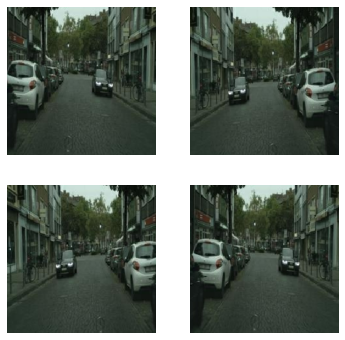

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
    rj_inp, rj_re = random_jitter(inp, re)
    plt.subplot(2, 2, i + 1)
    plt.imshow(rj_inp / 255.0)
    plt.axis('off')
plt.show()

We write functions to apply these functions to our data.

In [ ]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                     IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

The `tf.data` module has a convenient `map` function that lets us apply the functions above. `tf.data.AUTOTUNE` indicates to TensorFlow to use a built-in optimization algorithm to efficiently allocate CPU resources to applying our data augmentation. We then shuffle and batch our data.

In [ ]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
try:
    test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Building a U-Net
A U-Net consists of an "encoder" made of convolutions, a "decoder" made of transposed convolutions, and skip connections throughout. The idea is to extract features from the original image with our encoder, then reconstruct the segmented image with our decoder. A generic architecture is shown below:

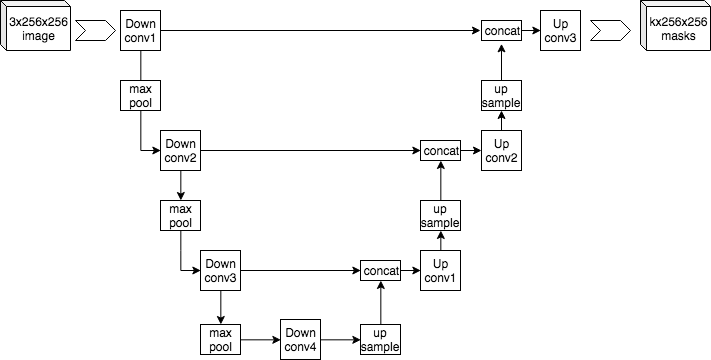

This downsample block will consist of:
- 2D convolution
- Batch normalization
- Leaky ReLU

Leaky ReLU attempts to alleviate the "dead ReLU" problem where the gradients of our ReLU neurons are always zero during training. The activation function is shown below:

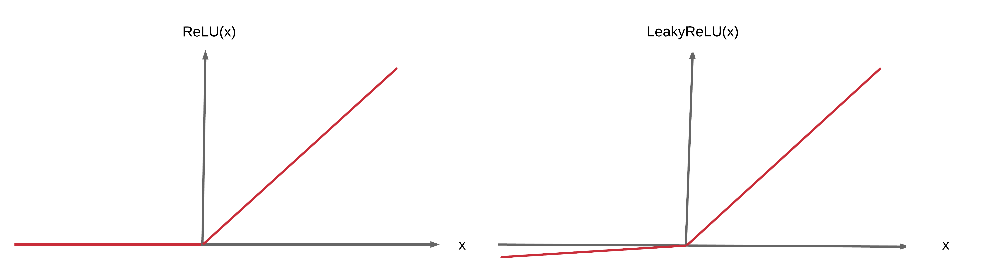

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
    # Initialize the weights from this normal distribution
    initializer = tf.random_normal_initializer(0., 0.02)

    # TODO: We can use a Keras Sequential model to represent this block
    result = tfk.Sequential()

    # TODO: Add Conv2D layer
    result.add(
        tfkl.Conv2D(filters, size, strides=2, padding='same', 
                    kernel_initializer=initializer, use_bias=False)
    )

    # TODO: Add BatchNorm
    if apply_batchnorm:
        result.add(tfkl.BatchNormalization())

    # TODO: Add LeakyReLU
    result.add(tfkl.LeakyReLU())

    return result

Let's check the output of our downsample block.

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


Our upsample block will resemble the downsample block, replacing the convolution with a transposed convolution. We will also have the option of applying dropout.

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    # TODO: Keras Sequential
    result = tfk.Sequential()

    # TODO: Add Conv2DTranspose layer
    result.add(
        tfkl.Conv2DTranspose(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)
    )

    # TODO: Add BatchNorm
    result.add(tfkl.BatchNormalization())

    # TODO: Add Dropout
    if apply_dropout:
        result.add(tfkl.Dropout(0.5))

    # TODO: Add ReLU
    result.add(tfkl.ReLU())

    return result

Let's check the output of our upsample block.

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Now let's construct our model using the Keras Functional API. Our input is of shape (256, 256, 3). We will downsample it to a (1, 1, 512) representation before upsampling it back to its original size. We will add skip connections throughout. Interestingly, the authors use an asymmetric convolution (even kernel size).

In [ ]:
def UNet():
    # Input to our layer
    inputs = tfkl.Input(shape=[256, 256, 3])

    # TODO: Down-stack
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    # TODO: Up-stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),   # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)

    # TODO: Last Conv2DTranspose layer
    last = tfkl.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, 
                                kernel_initializer=initializer, padding='same',
                                activation='tanh') # (batch_size, 256, 256, 3)

    x = inputs

    # TODO: Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    # TODO: Reverse skips
    skips = reversed(skips[:-1])

    # TODO: Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tfkl.Concatenate()([x, skip])

    x = last(x)

    return tfk.Model(inputs=inputs, outputs=x)

We will now plot a graph of our model.

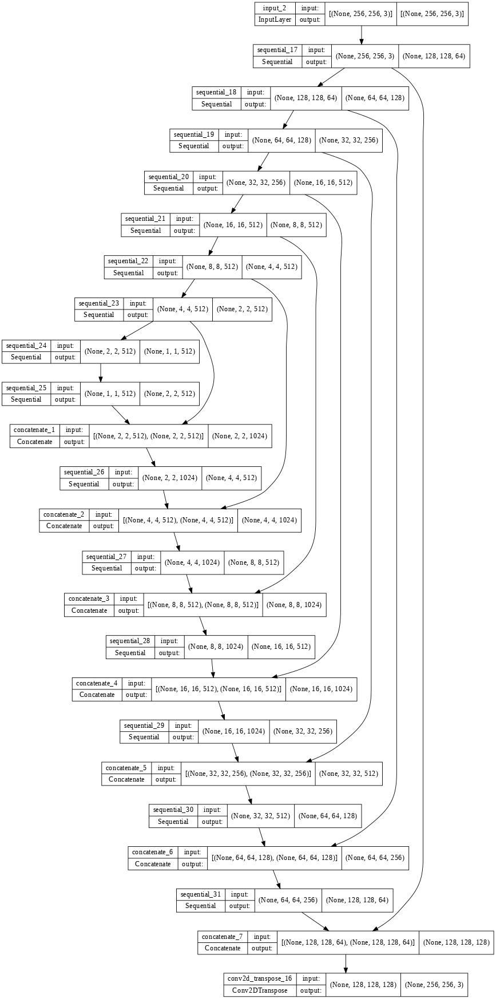

In [ ]:
unet = UNet()
tfk.utils.plot_model(unet, show_shapes=True, dpi=64)

Let's check the output of our model before training.

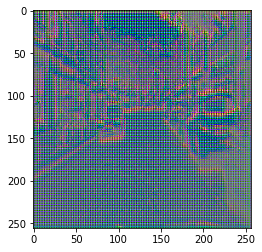

In [ ]:
unet_output = unet(inp[tf.newaxis, ...], training=False)
plt.imshow(unet_output[0, ...] * 0.5 + 0.5)
plt.show()

## Training the U-Net
We will use the Adam optimizer, which is the "goto" optimizer for modern deep learning. It has its origins in Adaptive Moment Estimation. It's essentially a hodgepodge of techniques from previous optimizers, extensively using exponential moving averages. We keep track of an EMA for our gradients to inform the direction of our updates, and an EMA for the squared gradients to provide an adaptive learning rate. Given our loss function $J(\theta)$, timestep $t$, learning rate $\eta$, and optional weight-decay parameter $\lambda$, the equations are,

$$g_t\leftarrow\nabla_\theta J_t(\theta_{t-1})+\lambda\theta_{t-1}$$
$$m_t\leftarrow\beta_1m_{t-1}-(1-\beta_1)g_t$$
$$s_t\leftarrow\beta_2s_{t-1}+(1-\beta_2)g_t⊙g_t$$
$$\hat{m}_t\leftarrow\frac{m_t}{1-\beta_1^t}$$
$$\hat{s}_t\leftarrow\frac{s_t}{1-\beta_2^t}$$
$$\theta_t\leftarrow\theta_{t-1}-\eta\,\hat{m}_t\oslash\sqrt{\hat{s}_t+\epsilon}$$

Where $⊙$ denotes element-wise multiplication, $⊘$ denotes element-wise division (Hadamard), and $\epsilon$ is a small constant added for numerical stability. In the AMSGrad variant of Adam, the only addition is that we simply take the maximum between the previous and current $\hat{s}$,

$$\hat{s}_t\leftarrow\max\left(\hat{s}_{t-1},\hat{s}_t\right)$$

In [ ]:
# TODO: Adam with eta = 2e-4, beta_1 = 0.5, beta_2 = 0.999, epsilon = 1e-7
optimizer = tfk.optimizers.Adam(2e-4, beta_1=0.5)

Let's write a helper function to visualize our model's predictions.

In [ ]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

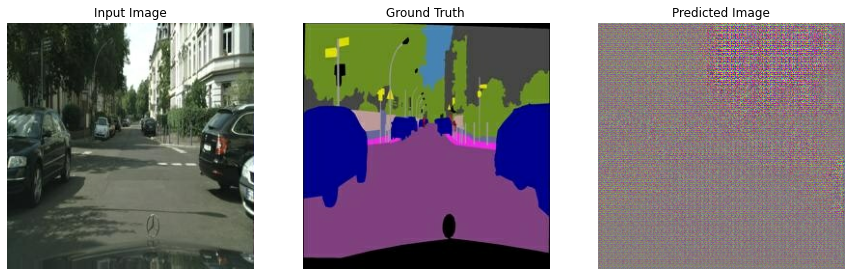

In [ ]:
for example_input, example_target in test_dataset.take(1):
    example_input, example_target = example_input, example_target
generate_images(unet, example_input, example_target)

We will use the MS-SSIM metric (`tf.image.ssim_multiscale`) to illustrate using a custom loss function. See the [documentation](https://www.tensorflow.org/api_docs/python/tf/image/ssim_multiscale) for more details. Mean-squared error tends to give blurry images, and mean-absolute error is generally preferred for image regression yet still suffers from blurriness. This metric is designed to mimic how similar the human eye perceives two images. It ranges from [0, 1] where 1 indicates an identical image and is also differentiable.

In [ ]:
# TODO: MS-SSIM loss
def ms_ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim_multiscale(y_true, y_pred, max_val=2, filter_size=3))

Let's compile our model and take a look at how many parameters we have. At ~54M, we definitely need to train on a GPU to finish in a reasonable time. Luckily, TensorFlow takes care of this for us.

In [ ]:
# TODO: Compile model
unet.compile(optimizer, loss=ms_ssim_loss)

In [ ]:
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_17 (Sequential)     (None, 128, 128, 64  3072        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_18 (Sequential)     (None, 64, 64, 128)  131584      ['sequential_17[0][0]']          
                                                                                              

We will write our logs and checkpoints to Google Drive. We will also write callback functions to improve our training process.

In [ ]:
log_dir = '/content/drive/MyDrive/unet/logs_lecture'
checkpoint_path = '/content/drive/MyDrive/unet/checkpoint_lecture'

In [ ]:
# Define some callbacks to improve training
tensorboard_callback = tfk.callbacks.TensorBoard(log_dir=log_dir)
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=5)
model_checkpoint = tfk.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True)

Let's also write a custom callback to plot the output of our model.

In [ ]:
class PlotCallback(tfk.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # TODO: Plot images
        print(f'\nEpoch:', epoch)
        generate_images(self.model, example_input, example_target)

In [ ]:
callbacks = [tensorboard_callback, early_stopping, reduce_lr, model_checkpoint, PlotCallback()]

Epoch 1/3
372/372 [==============================] - ETA: 0s - loss: 0.3567INFO:tensorflow:Assets written to: /content/drive/MyDrive/unet/checkpoint_lecture/assets

Epoch: 0


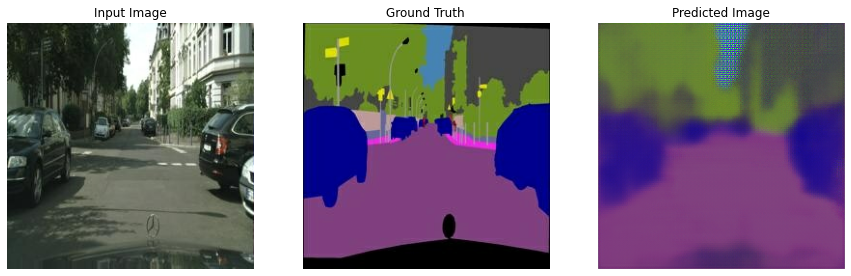

372/372 [==============================] - 77s 144ms/step - loss: 0.3567 - val_loss: 0.3914 - lr: 2.0000e-04
Epoch 2/3
372/372 [==============================] - ETA: 0s - loss: 0.3005INFO:tensorflow:Assets written to: /content/drive/MyDrive/unet/checkpoint_lecture/assets

Epoch: 1


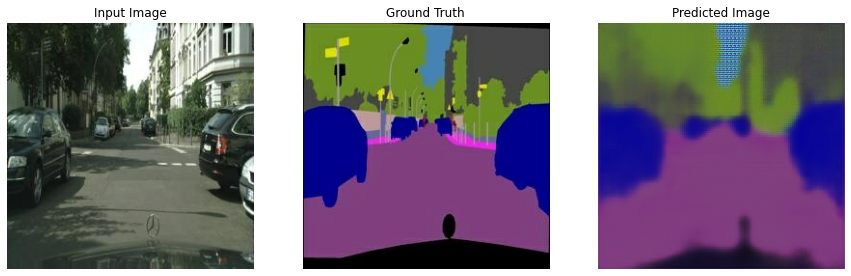

372/372 [==============================] - 62s 135ms/step - loss: 0.3005 - val_loss: 0.3453 - lr: 2.0000e-04
Epoch 3/3
372/372 [==============================] - ETA: 0s - loss: 0.2771INFO:tensorflow:Assets written to: /content/drive/MyDrive/unet/checkpoint_lecture/assets

Epoch: 2


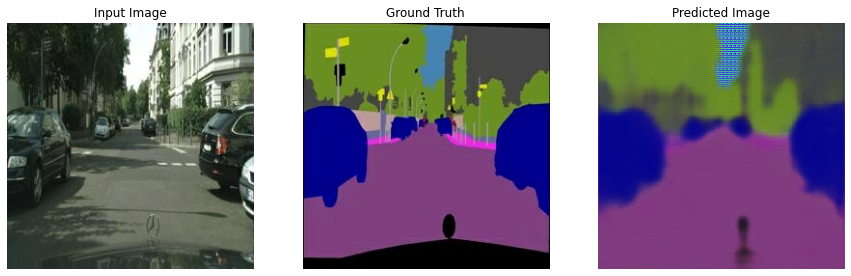

372/372 [==============================] - 63s 138ms/step - loss: 0.2771 - val_loss: 0.3181 - lr: 2.0000e-04


In [ ]:
# TODO: Fit model
unet.fit(train_dataset, validation_data=test_dataset, epochs=3, callbacks=callbacks)

## Testing the U-Net
Now we will check out the output of our model. Let's load it from our checkpoint. Note we must provide our custom loss function unless we add the `compile=False` flag to the `load_model` method. Note that I loaded my own model trained for 50 epochs here.

In [ ]:
# model = tfk.models.load_model(checkpoint_path, custom_objects={'ms_ssim_loss': ms_ssim_loss})
model = tfk.models.load_model(checkpoint_path, compile=False)

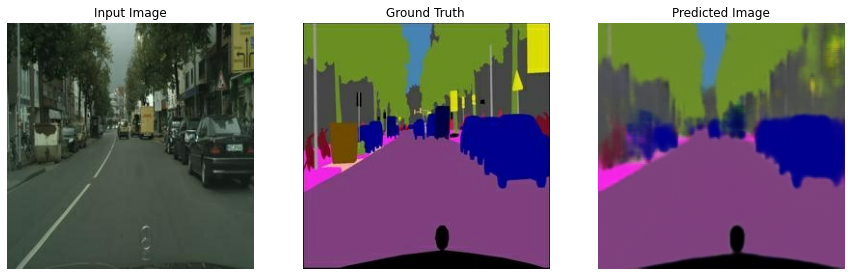

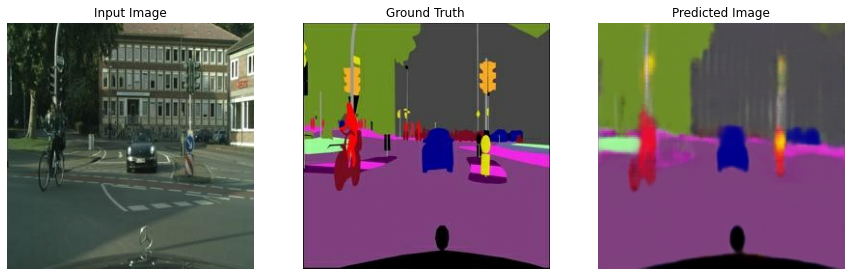

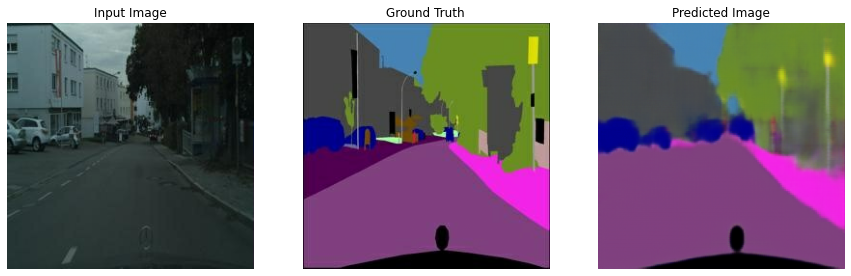

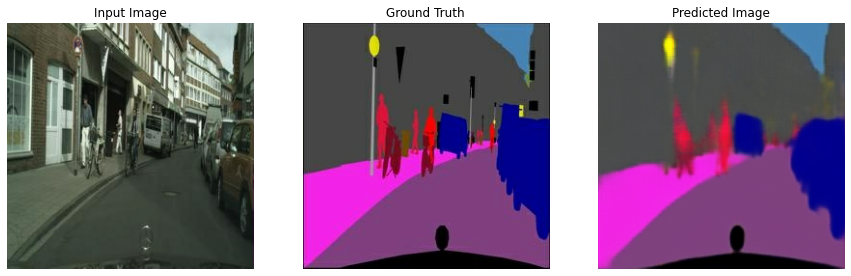

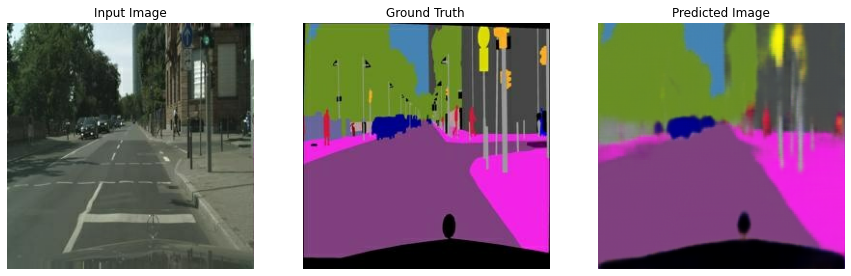

In [ ]:
for example_input, example_target in test_dataset.take(5):
    generate_images(model, example_input, example_target)

In [ ]:
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>